# MUSIC GENRE CLASSIFICATION

# 1. Import and Install Dependencies

## 1.1 Install Dependencies

In [22]:
!pip install tensorflow-io==0.23.1 opendatasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## 1.2 Load Dependencies




In [25]:
import os
from matplotlib import pyplot as plt
import tensorflow as tf 
import tensorflow_io as tfio
import opendatasets as od
import shutil
import librosa.display as ld
import librosa, IPython
from IPython.core.display import display
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten

## 1.3 CONNECTING GOOGLE DRIVE

We'll save our trained model to our Google Drive

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1.4 DOWNLOADING DATASET

We'll use "opendatasets" library to download the dataset from Kaggle.

In [4]:
od.download('https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: whitewolf47
Your Kaggle Key: ··········


100%|██████████| 1.21G/1.21G [00:08<00:00, 154MB/s]


**Note :** **After exploring the dataset, I found out that the jazz.00054.wav file is corrupted, so we'll just manually delete it.**

In [ ]:
#shutil.copyfile("/content/jazz.00054.wav", "/content/gtzan-dataset-music-genre-classification/Data/genres_original/jazz/jazz.00054.wav")

In [5]:
data_dir = "/content/gtzan-dataset-music-genre-classification/Data"

In [6]:
genres_dir = data_dir + "/genres_original"

# CHECK OUT THE AUDIO FILES

We'll just quickly check out one audio file from each genre by playing it.

In [ ]:
def play_audio(path):
  audio_data, sr = librosa.load(path)
  audio, _ = librosa.effects.trim(audio_data)
  display(IPython.display.Audio(audio_data, rate= sr))
  print('audio_data size :', audio_data.shape[0])
  print('Sample Rate :', sr)
  print('audio file len :', audio_data.shape[0]/sr)

In [ ]:
play_audio("/content/gtzan-dataset-music-genre-classification/Data/genres_original/blues/blues.00002.wav")

audio_data size : 661794
Sample Rate : 22050
audio file len : 30.013333333333332


In [ ]:
play_audio("/content/gtzan-dataset-music-genre-classification/Data/genres_original/classical/classical.00015.wav")

audio_data size : 661794
Sample Rate : 22050
audio file len : 30.013333333333332


In [ ]:
play_audio("/content/gtzan-dataset-music-genre-classification/Data/genres_original/country/country.00013.wav")

audio_data size : 661794
Sample Rate : 22050
audio file len : 30.013333333333332


In [ ]:
play_audio("/content/gtzan-dataset-music-genre-classification/Data/genres_original/disco/disco.00088.wav")

audio_data size : 661504
Sample Rate : 22050
audio file len : 30.00018140589569


In [ ]:
play_audio("/content/gtzan-dataset-music-genre-classification/Data/genres_original/hiphop/hiphop.00005.wav")

audio_data size : 661504
Sample Rate : 22050
audio file len : 30.00018140589569


In [ ]:
play_audio("/content/gtzan-dataset-music-genre-classification/Data/genres_original/jazz/jazz.00041.wav")

audio_data size : 661794
Sample Rate : 22050
audio file len : 30.013333333333332


In [ ]:
play_audio("/content/gtzan-dataset-music-genre-classification/Data/genres_original/metal/metal.00077.wav")

audio_data size : 661504
Sample Rate : 22050
audio file len : 30.00018140589569


In [ ]:
play_audio("/content/gtzan-dataset-music-genre-classification/Data/genres_original/pop/pop.00009.wav")

audio_data size : 661504
Sample Rate : 22050
audio file len : 30.00018140589569


In [ ]:
play_audio("/content/gtzan-dataset-music-genre-classification/Data/genres_original/reggae/reggae.00066.wav")

audio_data size : 661504
Sample Rate : 22050
audio file len : 30.00018140589569


In [ ]:
play_audio("/content/gtzan-dataset-music-genre-classification/Data/genres_original/rock/rock.00022.wav")

audio_data size : 661794
Sample Rate : 22050
audio file len : 30.013333333333332


# 2. Build Data Loading Function

## 2.1 Define Paths to Files

In [ ]:
sample_audio1 = os.path.join(genres_dir, 'blues', 'blues.00000.wav')
sample_audio2 = os.path.join(genres_dir, 'hiphop', 'hiphop.00000.wav')

## 2.2 Build Dataloading Function

In [7]:
def load_wav_16k_mono(filename):
    # Load encoded wav file
    file_contents = tf.io.read_file(filename)
    # Decode wav (tensors by channels) 
    wav, sample_rate = tf.audio.decode_wav(file_contents, desired_channels=1)
    # Removes trailing axis
    wav = tf.squeeze(wav, axis=-1)
    sample_rate = tf.cast(sample_rate, dtype=tf.int64)
    # Goes from 44100Hz to 16000hz - amplitude of the audio signal
    wav = tfio.audio.resample(wav, rate_in=sample_rate, rate_out=16000)
    return wav

## 2.3 Plot Wave

In [ ]:
wave1 = load_wav_16k_mono(sample_audio1)
wave2 = load_wav_16k_mono(sample_audio2)

In [ ]:
wave1

<tf.Tensor: shape=(480213,), dtype=float32, numpy=
array([-1.1846573e-07,  1.1970522e-07,  5.8367036e-08, ...,
       -3.6233854e-02, -3.6945825e-03,  3.8503282e-02], dtype=float32)>

In [ ]:
wave2

<tf.Tensor: shape=(480002,), dtype=float32, numpy=
array([ 2.73606474e-06, -6.44356442e-06,  1.17988275e-05, ...,
       -2.39441246e-02, -8.38493109e-02, -1.66682869e-01], dtype=float32)>

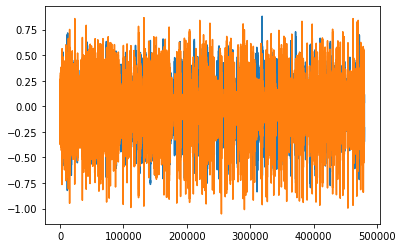

In [ ]:
plt.plot(wave1)
plt.plot(wave2)
plt.show()

# 3. Create Tensorflow Dataset

## 3.1 Define Paths to each Genre folder

In [ ]:
'''POS = os.path.join('z-by-hp-unlocked-challenge-3-signal-processing', 'Parsed_Capuchinbird_Clips')
NEG = os.path.join('z-by-hp-unlocked-challenge-3-signal-processing', 'Parsed_Not_Capuchinbird_Clips')'''

"POS = os.path.join('z-by-hp-unlocked-challenge-3-signal-processing', 'Parsed_Capuchinbird_Clips')\nNEG = os.path.join('z-by-hp-unlocked-challenge-3-signal-processing', 'Parsed_Not_Capuchinbird_Clips')"

In [9]:
genres_list = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
genres_list

['blues',
 'classical',
 'country',
 'disco',
 'hiphop',
 'jazz',
 'metal',
 'pop',
 'reggae',
 'rock']

In [10]:
genres_path = {}
for genre in genres_list:
  genres_path[genre] = os.path.join(genres_dir,genre)

In [11]:
genres_path

{'blues': '/content/gtzan-dataset-music-genre-classification/Data/genres_original/blues',
 'classical': '/content/gtzan-dataset-music-genre-classification/Data/genres_original/classical',
 'country': '/content/gtzan-dataset-music-genre-classification/Data/genres_original/country',
 'disco': '/content/gtzan-dataset-music-genre-classification/Data/genres_original/disco',
 'hiphop': '/content/gtzan-dataset-music-genre-classification/Data/genres_original/hiphop',
 'jazz': '/content/gtzan-dataset-music-genre-classification/Data/genres_original/jazz',
 'metal': '/content/gtzan-dataset-music-genre-classification/Data/genres_original/metal',
 'pop': '/content/gtzan-dataset-music-genre-classification/Data/genres_original/pop',
 'reggae': '/content/gtzan-dataset-music-genre-classification/Data/genres_original/reggae',
 'rock': '/content/gtzan-dataset-music-genre-classification/Data/genres_original/rock'}

## 3.2 Create Tensorflow Datasets

In [12]:
'''pos = tf.data.Dataset.list_files(POS+'/*.wav')
neg = tf.data.Dataset.list_files(NEG+'/*.wav')'''

"pos = tf.data.Dataset.list_files(POS+'/*.wav')\nneg = tf.data.Dataset.list_files(NEG+'/*.wav')"

In [13]:
genres_datasets = {}
for genre in genres_list:
  genres_datasets[genre] = tf.data.Dataset.list_files(genres_path[genre]+'/*.wav')

In [ ]:
genres_datasets

{'blues': <ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>,
 'classical': <ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>,
 'country': <ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>,
 'disco': <ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>,
 'hiphop': <ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>,
 'jazz': <ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>,
 'metal': <ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>,
 'pop': <ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>,
 'reggae': <ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>,
 'rock': <ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>}

## 3.3 Add labels and Combining eacg Genre dataset into one single dataset

In [ ]:
for i, genre in enumerate(genres_list):
  genres_datasets[genre] = tf.data.Dataset.zip((genres_datasets[genre], tf.data.Dataset.from_tensor_slices(tf.constant(i, shape=len(genres_datasets[genre])))))

In [ ]:
genres_datasets['disco'].as_numpy_iterator().next()

(b'/content/gtzan-dataset-music-genre-classification/Data/genres_original/disco/disco.00022.wav',
 3)

In [ ]:
len(genres_datasets['jazz'])

99

In [ ]:
data = genres_datasets['blues'].concatenate(genres_datasets['classical'])
for genre in genres_list:
  if genre not in ['blues', 'classical']:
    data = data.concatenate(genres_datasets[genre])

In [ ]:
len(data)

999

In [ ]:
'''positives = tf.data.Dataset.zip((pos, tf.data.Dataset.from_tensor_slices(tf.ones(len(pos)))))
negatives = tf.data.Dataset.zip((neg, tf.data.Dataset.from_tensor_slices(tf.zeros(len(neg)))))
data = positives.concatenate(negatives)'''

'positives = tf.data.Dataset.zip((pos, tf.data.Dataset.from_tensor_slices(tf.ones(len(pos)))))\nnegatives = tf.data.Dataset.zip((neg, tf.data.Dataset.from_tensor_slices(tf.zeros(len(neg)))))\ndata = positives.concatenate(negatives)'

# 4. Determine Average Length of an Audio file

## 4.1 Calculate Wave Cycle Length

In [ ]:
'''lengths = []
for genre in genres_list:
  for file in os.listdir(genres_path[genre]):
    wave = load_wav_16k_mono(os.path.join(genres_path[genre], file))
    lengths.append(len(wave))'''

'lengths = []\nfor genre in genres_list:\n  for file in os.listdir(genres_path[genre]):\n    #if file not in ["jazz.00045.wav", "jazz.00085.wav"]:\n    print(file)\n    wave = load_wav_16k_mono(os.path.join(genres_path[genre], file))\n    lengths.append(len(wave))'

## 4.2 Calculate Mean, Min and Max

In [ ]:
#tf.math.reduce_mean(lengths)

In [ ]:
#tf.math.reduce_min(lengths)

In [ ]:
#tf.math.reduce_max(lengths)

# 5. Build Preprocessing Function to Convert to Spectrogram

## 5.1 Build Preprocessing Function

In [ ]:
def preprocess(file_path, label): 
    wav = load_wav_16k_mono(file_path)
    wav = wav[:480000]
    zero_padding = tf.zeros([480000] - tf.shape(wav), dtype=tf.float32)
    wav = tf.concat([zero_padding, wav],0)
    spectrogram = tf.signal.stft(wav, frame_length=3000, frame_step=3000)
    spectrogram = tf.abs(spectrogram)
    spectrogram = tf.expand_dims(spectrogram, axis=2)
    return spectrogram, label

## 5.2 Test Out the Function and Viz the Spectrogram

In [ ]:
filepath, label = genres_datasets['jazz'].shuffle(buffer_size=10000).as_numpy_iterator().next()

In [ ]:
spectrogram, label = preprocess(filepath, label)

In [ ]:
spectrogram.shape

TensorShape([160, 2049, 1])

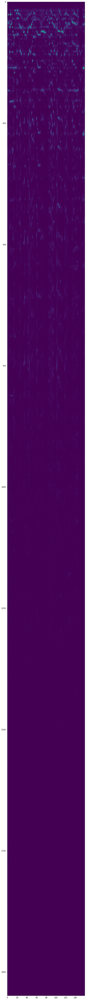

In [ ]:
plt.figure(figsize=(100,100))
plt.imshow(tf.transpose(spectrogram)[0])
plt.show()

# 6. Create Training and Testing Partitions

## 6.1 Create a Tensorflow Data Pipeline

In [ ]:
data = data.map(preprocess)
data = data.cache()
data = data.shuffle(buffer_size=1000)
data = data.batch(2)
data = data.prefetch(1)

## 6.2 Split into Training and Testing Partitions

In [ ]:
train = data.take(400)
test = data.skip(400).take(100)

## 6.3 Test One Batch

In [ ]:
samples, labels = train.as_numpy_iterator().next()

In [ ]:
samples.shape

# 7. Build Deep Learning Model

In [ ]:
#tf.keras.backend.clear_session()

## 7.1 Build Sequential Model, Compile and View Summary

In [ ]:
model = Sequential()
model.add(Conv2D(16, (3,3), activation='relu', input_shape=(160, 2049, 1)))
model.add(Conv2D(16, (3,3), activation='relu'))
model.add(Flatten())
#model.add(Dense(100, activation='relu'))
model.add(Dense(50, activation='relu'))
model.add(Dense(10, activation='sigmoid'))

In [26]:
def create_model():

  Model = Sequential()
  Model.add(Conv2D(16, (3,3), activation='relu', input_shape=(160, 2049, 1)))
  Model.add(Conv2D(16, (3,3), activation='relu'))
  Model.add(Flatten())
  #Model.add(Dense(100, activation='relu'))
  Model.add(Dense(50, activation='relu'))
  Model.add(Dense(10, activation='sigmoid'))

  return Model

In [27]:
model = create_model()

In [ ]:
model.compile('Adam', loss='SparseCategoricalCrossentropy', metrics=[tf.keras.metrics.SparseCategoricalAccuracy()])

In [ ]:
checkpoint_path = "/content/drive/My Drive/audio_classf_train/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

In [ ]:
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 158, 2047, 16)     160       
                                                                 
 conv2d_1 (Conv2D)           (None, 156, 2045, 16)     2320      
                                                                 
 flatten (Flatten)           (None, 5104320)           0         
                                                                 
 dense (Dense)               (None, 50)                255216050 
                                                                 
 dense_1 (Dense)             (None, 10)                510       
                                                                 
Total params: 255,219,040
Trainable params: 255,219,040
Non-trainable params: 0
_________________________________________________________________


## 7.3 Fit Model, View Loss and KPI Plots

In [ ]:
hist = model.fit(train, epochs=10, validation_data=test, callbacks=[cp_callback])

Epoch 1/10
400/400 [==============================] - ETA: 0s - loss: 36.9908 - sparse_categorical_accuracy: 0.1963
Epoch 1: saving model to /content/drive/My Drive/audio_classf_train/cp.ckpt
400/400 [==============================] - 146s 119ms/step - loss: 36.9908 - sparse_categorical_accuracy: 0.1963 - val_loss: 1.2900 - val_sparse_categorical_accuracy: 0.6985
Epoch 2/10
400/400 [==============================] - ETA: 0s - loss: 0.9454 - sparse_categorical_accuracy: 0.7588
Epoch 2: saving model to /content/drive/My Drive/audio_classf_train/cp.ckpt
400/400 [==============================] - 49s 123ms/step - loss: 0.9454 - sparse_categorical_accuracy: 0.7588 - val_loss: 0.2791 - val_sparse_categorical_accuracy: 0.9497
Epoch 3/10
400/400 [==============================] - ETA: 0s - loss: 0.2856 - sparse_categorical_accuracy: 0.9413
Epoch 3: saving model to /content/drive/My Drive/audio_classf_train/cp.ckpt
400/400 [==============================] - 49s 121ms/step - loss: 0.2856 - spars

## 7.1 Reloading Model from last checkpoint

In [ ]:
os.listdir(checkpoint_dir)

['cp.ckpt_temp', 'cp.ckpt.data-00000-of-00001', 'checkpoint', 'cp.ckpt.index']

In [ ]:
latest = tf.train.latest_checkpoint(checkpoint_dir)
latest

'/content/drive/My Drive/audio_classf_train/cp.ckpt'

In [ ]:
# Create a new model instance
reloaded_model = create_model()

# Load the previously saved weights
reloaded_model.load_weights(latest)

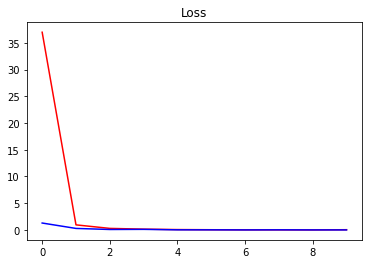

In [ ]:
plt.title('Loss')
plt.plot(hist.history['loss'], 'r')
plt.plot(hist.history['val_loss'], 'b')
plt.show()

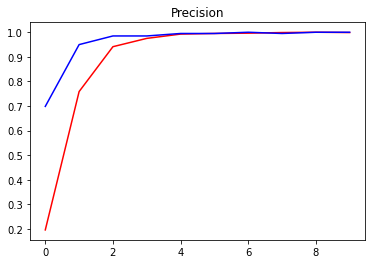

In [ ]:
plt.title('Precision')
plt.plot(hist.history['sparse_categorical_accuracy'], 'r')
plt.plot(hist.history['val_sparse_categorical_accuracy'], 'b')
plt.show()

In [ ]:
'''plt.title('Recall')
plt.plot(hist.history['recall'], 'r')
plt.plot(hist.history['val_recall'], 'b')
plt.show()'''

"plt.title('Recall')\nplt.plot(hist.history['recall'], 'r')\nplt.plot(hist.history['val_recall'], 'b')\nplt.show()"

In [ ]:
model.save("audioclassf.h5")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp "/content/audioclassf.h5" "/content/drive/My Drive"

# 8. Make a Prediction on a Single Clip

## 8.1 Get One Batch and Make a Prediction

In [ ]:
X_test, y_test = test.as_numpy_iterator().next()

In [ ]:
yhat = reloaded_model.predict(X_test)

In [ ]:
yhat[0]

array([3.4612322e-01, 8.6982322e-01, 9.9049193e-01, 7.3014596e-04,
       3.1656612e-02, 9.8129946e-01, 9.9956828e-01, 9.7940445e-01,
       4.7273058e-03, 1.0000000e+00], dtype=float32)

In [ ]:
list(yhat[0]).index(max(yhat[0]))

9

## 8.2 Convert Logits to Classes 

In [ ]:
yhat = [list(yhat[0]).index(max(yhat[0])), list(yhat[1]).index(max(yhat[1]))]

In [ ]:
y_test

array([9, 4], dtype=int32)

In [ ]:
yhat

[9, 4]